In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/MDS project/df_gpt4.csv')

df = df.dropna(subset=['cleaned text'])

df

,Institution name,Main panel_x,Unit of assessment number_x,Unit of assessment name,Title,Summary impact type,Countries,Formal partners,Funding programmes,Global research identifiers,...,1. Summary of the impact,2. Underpinning research,3. References to the research,4. Details of the impact,5. Sources to corroborate the impact,Weighted Avg,Variance,5 Class Labels,9 Class Labels,cleaned text
0,University of East London,C,21.0,Sociology,"?Go Home?; Shaping the practice, policy and un...",Societal,[Italy];[Sweden];[Netherlands ];[Ireland];[Uni...,[University of Eastern Finland];[Middle East T...,[European Commission under the 7th Framework P...,NaN,...,### 1. Summary of the impact \(indicative max...,### 2. Underpinning research \(indicative max...,### 3. References to the research \(indicativ...,### 4. Details of the impact \(indicative max...,### 5. Sources to corroborate the impact \(in...,2.667,0.556111,3,5,"Since 2013, CMRB findings have been used to su..."
1,University of Lincoln,A,6.0,"Agriculture, Food and Veterinary Sciences",Agricultural Robotics: Data Driven Technologie...,Technological,[England];[Norway];[USA],[SAGA Robotics];[Garford Farms Limited];[Berry...,[N/A],[grid.423443.6];[grid.418100.c],...,### 1. Summary of the impact \(indicative max...,### 2. Underpinning research \(indicative max...,### 3. References to the research \(indicativ...,### 4. Details of the impact \(indicative max...,### 5. Sources to corroborate the impact \(in...,3.000,0.666000,3,6,UoL’s innovative agri-food research has underp...
2,University of Cambridge,A,4.0,"Psychology, Psychiatry and Neuroscience",Alleviating the societal and economic burden o...,Health,[England];[China];[USA];[Canada];[Belgium];[Fr...,NaN,NaN,[grid.14105.31];[grid.473755.7];[grid.52788.30],...,**1. Summary of the impact** \(indicative maxi...,**2. Underpinning research \(indicative maximu...,**3. References to the research** \(indicative...,**4. Details of the impact** \(indicative maxi...,**5. Sources to corroborate the impact** \(ind...,3.667,0.444111,4,7,The Cambridge University research has had a si...
3,University of Cambridge,A,6.0,"Agriculture, Food and Veterinary Sciences",Changes in policy for the control of bovine tu...,Environmental,[England];[Wales];[Ethiopia],NaN,NaN,[grid.418100.c];[grid.434257.3];[grid.433527.4...,...,### 1. Summary of the impact \(indicative max...,### 2. Underpinning research \(indicative max...,### 3. References to the research \(indicativ...,### 4. Details of the impact \(indicative max...,### 5. Sources to corroborate the impact \(in...,3.500,0.450000,4,7,Bovine tuberculosis is a substantial economic ...
4,University of Derby,C,20.0,Social Work and Social Policy,Changing Police and Investigative Practice thr...,Legal,NaN,NaN,NaN,NaN,...,### 1. Summary of the impact \(indicative max...,### 2. Underpinning research \(indicative max...,### 3. References to the research \(indicativ...,### 4. Details of the impact \(indicative max...,### 5. Sources to corroborate the impact \(in...,2.333,1.554111,2,5,The impact of Bull's work is on: (1) internati...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6293,School of Oriental and African Studies,C,22.0,Anthropology and Development Studies,Transforming Working Practices in the House of...,Societal,"[UK, Europe, Asia, Africa]",[Hansard Society];[Leeds University];[Jawaharl...,[ERC-2018-ADG - ERC Advanced Grant];[Research ...,[grid.452896.4];[grid.452966.a];[grid.426413.6...,...,**1. Summary of the impact** \(indicative maxi...,**2. Underpinning research** \(indicative maxi...,**3. References to the research** \(indicative...,**4. Details of the impact** \(indicative maxi...,**5. Sources to corroborate the impact** \(ind...,3.750,0.187500,4,8,"Many scholars, MPs, civil servants and Commons..."
6300,Nottingham Trent University,A,3.0,"Allied Health Professions, Dentistry, Nursing ...",Translating biomedical nanotechnology into com...,Technological,"[Algeria,

In [ ]:
import pandas as pd
import tensorflow
from nltk.tokenize import regexp_tokenize, sent_tokenize
from nltk import pos_tag_sents
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from string import punctuation
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
import numpy as np
import re
import time
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim.models import KeyedVectors
from gensim.models import Word2Vec
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.decomposition import TruncatedSVD
from sklearn.neighbors import KNeighborsClassifier
from tqdm import tqdm
from sklearn.model_selection import GridSearchCV
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import to_categorical

import nltk
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
nltk.download('stopwords')


#Dictionary of contractions for replacement

contractions = {
          "ain't": "am not",
          "aren't": "are not",
          "can't": "cannot",
          "can't've": "cannot have",
          "'cause": "because",
          "could've": "could have",
          "couldn't": "could not",
          "couldn't've": "could not have",
          "didn't": "did not",
          "doesn't": "does not",
          "don't": "do not",
          "hadn't": "had not",
          "hadn't've": "had not have",
          "hasn't": "has not",
          "haven't": "have not",
          "he'd": "he would",
          "he'd've": "he would have",
          "he'll": "he will",
          "he'll've": "he will have",
          "he's": "he is",
          "how'd": "how did",
          "how'd'y": "how do you",
          "how'll": "how will",
          "how's": "how is",
          "i'd": "i would",
          "i'd've": "i would have",
          "i'll": "i will",
          "i'll've": "i will have",
          "i'm": "i am",
          "i've": "i have",
          "isn't": "is not",
          "it'd": "it had",
          "it'd've": "it would have",
          "it'll": "it will",
          "it'll've": "it will have",
          "it's": "it is",
          "let's": "let us",
          "ma'am": "madam",
          "mayn't": "may not",
          "might've": "might have",
          "mightn't": "might not",
          "mightn't've": "might not have",
          "must've": "must have",
          "mustn't": "must not",
          "mustn't've": "must not have",
          "needn't": "need not",
          "needn't've": "need not have",
          "o'clock": "of the clock",
          "oughtn't": "ought not",
          "oughtn't've": "ought not have",
          "shan't": "shall not",
          "sha'n't": "shall not",
          "shan't've": "shall not have",
          "she'd": "she would",
          "she'd've": "she would have",
          "she'll": "she will",
          "she'll've": "she will have",
          "she's": "she is",
          "should've": "should have",
          "shouldn't": "should not",
          "shouldn't've": "should not have",
          "so've": "so have",
          "so's": "so is",
          "that'd": "that would",
          "that'd've": "that would have",
          "that's": "that is",
          "there'd": "there had",
          "there'd've": "there would have",
          "there's": "there is",
          "they'd": "they would",
          "they'd've": "they would have",
          "they'll": "they will",
          "they'll've": "they will have",
          "they're": "they are",
          "they've": "they have",
          "to've": "to have",
          "wasn't": "was not",
          "we'd": "we had",
          "we'd've": "we would have",
          "we'll": "we will",
          "we'll've": "we will have",
          "we're": "we are",
          "we've": "we have",
          "weren't": "were not",
          "what'll": "what will",
          "what'll've": "what will have",
          "what're": "what are",
          "what's": "what is",
          "what've": "what have",
          "when's": "when is",
          "when've": "when have",
          "where'd": "where did",
          "where's": "where is",
          "where've": "where have",
          "who'll": "who will",
          "who'll've": "who will have",
          "who's": "who is",
          "who've": "who have",
          "why's": "why is",
          "why've": "why have",
          "will've": "will have",
          "won't": "will not",
          "won't've": "will not have",
          "would've": "would have",
          "wouldn't": "would not",
          "wouldn't've": "would not have",
          "y'all": "you all",
          "y'alls": "you alls",
          "y'all'd": "you all would",
          "y'all'd've": "you all would have",
          "y'all're": "you all are",
          "y'all've": "you all have",
          "you'd": "you had",
          "you'd've": "you would have",
          "you'll": "you you will",
          "you'll've": "you you will have",
          "you're": "you are",
          "you've": "you have"
            }

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
def penn_to_wordnet(penn_pos_tag):

    # Function to convert Penn Treebank part-of-speed tags to corresponding WordNet

    tag_dictionary = {
        'NN': 'n', 'NNS': 'n', 'NNP': 'n', 'NNPS': 'n',
        'JJ': 'a', 'JJR': 'a', 'JJS': 'a',
        'VB': 'v', 'VBD': 'v', 'VBG': 'v', 'VBN': 'v', 'VBP': 'v', 'VBZ': 'v',
        'RB': 'r', 'RBR': 'r', 'RBS': 'r',
        'MD': 'v'  }


    # return the WordNet tag for given Peen Treebank tag, return "n" if none found

    try:
        return tag_dictionary[penn_pos_tag[:2]]

    except:
        return "n"


stopwords_set = stopwords.words("english")

punctuation_set = set(punctuation)

wnl = WordNetLemmatizer()


def preprocess_text(text):

    # account for edge case when text is empty

    if not isinstance(text, str):
        return ""

    # Convert all text to lowercase

    text = text.lower()

    # Remove characters that are repeated more than twice in a row

    text = re.sub(r'(.)\1{2,}', r'\1', text)

    # Replace URLs with space

    text = re.sub(r"http\S+"," ", text)

    # Remove HTML tags from text

    text = re.sub("<.*?>", "", text)

    # Ensure that there is space after each period

    text = re.sub(r'\.(?![ .])', '. ', text)

    # Replace line break tags with space

    text = re.sub(r'<br />', ' ', text)

    # Remove words containing digits

    text = re.sub(r'\d+', '', text)

    # Remove all numbers

    text = re.sub(r'\b(?=.*\d)(?=.*[a-zA-Z]).*?\b', '', text)

    # Remove all numbers including floating points

    text = re.sub(r'\b\d+(\.\d+)?', '', text)

    new_sentences = []

    #regexp tokenizer tokenizes sentences

    tokenized_sentences = [regexp_tokenize(sent, pattern = "\s+", gaps = True) for sent in sent_tokenize(text)]

    # Tokenize the cleaned text into sentences, then tokenize each sentence into words while removing spaces

    # Find pos tags for each sentence, pos_tag sents is faster than pos_tag

    new_sentences = []

    for sentences in pos_tag_sents(tokenized_sentences):
        new_sentence = []
        #iterate through word/tag pair
        for word, tag in sentences:
            # Check if word in punctuation and stopwords list
            if word not in punctuation_set and word not in stopwords_set:
                if word in contractions:
                    # Expand contractions
                    words = contractions[word].split(" ")
                    new_sentence = new_sentence + words
                else:
                    # Get WordNet Pos Tag and lemmatize word
                    wordnet_pos = penn_to_wordnet(tag)
                    lemmatized_word = wnl.lemmatize(word, pos = wordnet_pos)
                    # Remove non-alphanumeric characters

                    lemmatized_word = re.sub(r'[^\w\s]', '', lemmatized_word)

                    #Check if lemmatized word exists and has length greater than 2

                    if lemmatized_word and len(lemmatized_word) > 2:
                        new_sentence.append(lemmatized_word)

        if new_sentence:
            new_sentences.append(new_sentence)

    return new_sentences


In [ ]:
new_df = df[df["Main panel_x"] == "A"]

new_df["Unit of assessment name"].value_counts()

,count
Unit of assessment name,
"Allied Health Professions, Dentistry, Nursing and Pharmacy",386
"Psychology, Psychiatry and Neuroscience",303
Clinical Medicine,237
Biological Sciences,185
"Public Health, Health Services and Primary Care",143
"Agriculture, Food and Veterinary Sciences",96


In [ ]:
new_df = df[["Main panel_x","Unit of assessment number_x","Title","cleaned text","5 Class Labels","Summary impact type","9 Class Labels", "Variance"]]

new_df = new_df[new_df["Main panel_x"] == "A"]

new_df["sentence tokenized"] = new_df["cleaned text"].apply(lambda x: preprocess_text(x))


In [ ]:
def flatten(sents_tokenized):
    return [word for sentence in sents_tokenized for word in sentence]

def tokens_to_string(tokens):
    return ' '.join(tokens)


new_df["word tokenized"] = new_df["sentence tokenized"].apply(lambda x: flatten(x))

new_df["string"] = new_df["word tokenized"].apply(lambda x: tokens_to_string(x))

In [ ]:
def map_labels(label):
    if label in [0, 1, 2, 3, 4, 5]:
        return 0
    elif label in [6, 7]:
        return 1
    elif label == 8:
        return 2
    else:
        return label

new_df['3 Class Labels'] = df['9 Class Labels'].apply(map_labels)


In [ ]:
#pip install openai==0.28.1

In [ ]:
#import openai
#import pandas as pd

#import time
#import openai
#from tenacity import retry, wait_fixed, stop_after_attempt

#@retry(wait=wait_fixed(2), stop=stop_after_attempt(5))
#def get_embedding(text, model="text-embedding-ada-002"):
#    text = text.replace("\n", " ")
#    response = openai.Embedding.create(input=[text], model=model)
#    return response['data'][0]['embedding']

# Apply the function with retry to each row in your DataFrame
#new_df['gpt_embedding'] = new_df['cleaned text'].apply(lambda x: get_embedding(x, model='text-embedding-3-large'))


In [ ]:
#new_df.to_csv('full_text_with_gpt_embeddings.csv', index=False)


In [ ]:
#augmented_df = pd.read_csv('augmented_df_with_embeddings.csv')

#test_df = pd.read_csv('test_df_with_embeddings.csv')

#test_df['gpt_embedding'] = test_df['gpt_embedding'].apply(ast.literal_eval)

#augmented_df['gpt_embedding'] = augmented_df['gpt_embedding'].apply(ast.literal_eval)

#augmented_df

In [ ]:
import ast

new_df = pd.read_csv('/content/drive/MyDrive/MDS project/full_text_with_gpt_embeddings.csv')

new_df["gpt_embedding"] = new_df["gpt_embedding"].apply(lambda x: ast.literal_eval(x))

new_df

,Main panel_x,Unit of assessment number_x,Title,cleaned text,5 Class Labels,Summary impact type,9 Class Labels,Variance,sentence tokenized,word tokenized,string,3 Class Labels,gpt_embedding
0,A,6.0,Agricultural Robotics: Data Driven Technologie...,UoL’s innovative agri-food research has underp...,3,Technological,6,0.666000,"[['uols', 'innovative', 'agrifood', 'research'...","['uols', 'innovative', 'agrifood', 'research',...",uols innovative agrifood research underpin ser...,1,"[0.02778695523738861, 0.03656265512108803, -0...."
1,A,4.0,Alleviating the societal and economic burden o...,The Cambridge University research has had a si...,4,Health,7,0.444111,"[['cambridge', 'university', 'research', 'sign...","['cambridge', 'university', 'research', 'signi...",cambridge university research significant farr...,1,"[0.025444526225328445, 0.022561024874448776, -..."
2,A,6.0,Changes in policy for the control of bovine tu...,Bovine tuberculosis is a substantial economic ...,4,Environmental,7,0.450000,"[['bovine', 'tuberculosis', 'substantial', 'ec...","['bovine', 'tuberculosis', 'substantial', 'eco...",bovine tuberculosis substantial economic anima...,1,"[0.019888462498784065, 0.023631425574421883, -..."
3,A,2.0,Empowering personalised discussion and advance...,Advance decisions about resuscitation are a gl...,4,Health,7,0.358124,"[['advance', 'decision', 'resuscitation', 'glo...","['advance', 'decision', 'resuscitation', 'glob...",advance decision resuscitation global health e...,1,"[0.02248365618288517, -0.008871562778949738, -..."
4,A,5.0,Improving patient outcomes and treatment guide...,Professor Irving's research has been instrumen...,3,Health,6,0.454204,"[['professor', 'irvings', 'research', 'instrum...","['professor', 'irvings', 'research', 'instrume...",professor irvings research instrumental set na...,1,"[-0.002802259288728237, 0.043551620095968246, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1345,A,4.0,Transforming the use of Arterial Spin Labellin...,The Arterial Spin Labelling In Dementia (AID) ...,4,Technological,7,0.655264,"[['arterial', 'spin', 'labelling', 'dementia',...","['arterial', 'spin', 'labelling', 'dementia', ...",arterial spin labelling dementia aid programme...,1,"[0.02346917614340782, 0.010281388647854328, -0..."
1346,A,5.0,Transforming therapeutic outcomes of fatal Duc...,Research undertaken at RHUL led to the develop...,3,Health,7,0.222111,"[['research', 'undertaken', 'rhul', 'lead', 'd...","['research', 'undertaken', 'rhul', 'lead', 'de...",research undertaken rhul lead development gene...,1,"[0.0031257031951099634, 0.024351993575692177, ..."
1347,A,3.0,Transforming Treatment for Obstructive Sleep A...,Obstructive sleep apnoea (OSA) is one of the m...,3,Health,7,0.234375,"[['obstructive', 'sleep', 'apnoea', 'osa', 'on...","['obstructive', 'sleep', 'apnoea', 'osa', 'one...",obstructive sleep apnoea osa one common respir...,1,"[0.028280194848775864, 0.0345553383231163, -0...."
1348,A,1.0,Transforming vaccine policy for pneumococcal d...,It was the result of Professor Lim's expertise...,3,Health,7,0.334111,"[['result', 'professor', 'lims', 'expertise', ...","['result', 'professor', 'lims', 'expertise', '...",result professor lims expertise field large sp...,1,"[0.012853133492171764, 0.03865852206945419, -0..."


In [ ]:
pip install sentence_transformers umap-learn hdbscan bertopic

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 249.1/249.1 kB 923.3 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 103.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 5.7 MB/s eta 0:00:00


In [ ]:
!pip install --upgrade bertopic


In [ ]:
new_df

,Main panel_x,Unit of assessment number_x,Title,cleaned text,5 Class Labels,Summary impact type,9 Class Labels,Variance,sentence tokenized,word tokenized,string,3 Class Labels,gpt_embedding
0,A,6.0,Agricultural Robotics: Data Driven Technologie...,UoL’s innovative agri-food research has underp...,3,Technological,6,0.666000,"[['uols', 'innovative', 'agrifood', 'research'...","['uols', 'innovative', 'agrifood', 'research',...",uols innovative agrifood research underpin ser...,1,"[0.02778695523738861, 0.03656265512108803, -0...."
1,A,4.0,Alleviating the societal and economic burden o...,The Cambridge University research has had a si...,4,Health,7,0.444111,"[['cambridge', 'university', 'research', 'sign...","['cambridge', 'university', 'research', 'signi...",cambridge university research significant farr...,1,"[0.025444526225328445, 0.022561024874448776, -..."
2,A,6.0,Changes in policy for the control of bovine tu...,Bovine tuberculosis is a substantial economic ...,4,Environmental,7,0.450000,"[['bovine', 'tuberculosis', 'substantial', 'ec...","['bovine', 'tuberculosis', 'substantial', 'eco...",bovine tuberculosis substantial economic anima...,1,"[0.019888462498784065, 0.023631425574421883, -..."
3,A,2.0,Empowering personalised discussion and advance...,Advance decisions about resuscitation are a gl...,4,Health,7,0.358124,"[['advance', 'decision', 'resuscitation', 'glo...","['advance', 'decision', 'resuscitation', 'glob...",advance decision resuscitation global health e...,1,"[0.02248365618288517, -0.008871562778949738, -..."
4,A,5.0,Improving patient outcomes and treatment guide...,Professor Irving's research has been instrumen...,3,Health,6,0.454204,"[['professor', 'irvings', 'research', 'instrum...","['professor', 'irvings', 'research', 'instrume...",professor irvings research instrumental set na...,1,"[-0.002802259288728237, 0.043551620095968246, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1345,A,4.0,Transforming the use of Arterial Spin Labellin...,The Arterial Spin Labelling In Dementia (AID) ...,4,Technological,7,0.655264,"[['arterial', 'spin', 'labelling', 'dementia',...","['arterial', 'spin', 'labelling', 'dementia', ...",arterial spin labelling dementia aid programme...,1,"[0.02346917614340782, 0.010281388647854328, -0..."
1346,A,5.0,Transforming therapeutic outcomes of fatal Duc...,Research undertaken at RHUL led to the develop...,3,Health,7,0.222111,"[['research', 'undertaken', 'rhul', 'lead', 'd...","['research', 'undertaken', 'rhul', 'lead', 'de...",research undertaken rhul lead development gene...,1,"[0.0031257031951099634, 0.024351993575692177, ..."
1347,A,3.0,Transforming Treatment for Obstructive Sleep A...,Obstructive sleep apnoea (OSA) is one of the m...,3,Health,7,0.234375,"[['obstructive', 'sleep', 'apnoea', 'osa', 'on...","['obstructive', 'sleep', 'apnoea', 'osa', 'one...",obstructive sleep apnoea osa one common respir...,1,"[0.028280194848775864, 0.0345553383231163, -0...."
1348,A,1.0,Transforming vaccine policy for pneumococcal d...,It was the result of Professor Lim's expertise...,3,Health,7,0.334111,"[['result', 'professor', 'lims', 'expertise', ...","['result', 'professor', 'lims', 'expertise', '...",result professor lims expertise field large sp...,1,"[0.012853133492171764, 0.03865852206945419, -0..."


In [ ]:
import sys
sys.modules['openai'] = None

import pandas as pd
import numpy as np
from sentence_transformers import SentenceTransformer
from umap import UMAP
from hdbscan import HDBSCAN
from bertopic import BERTopic
from bertopic.vectorizers import ClassTfidfTransformer
from collections import Counter
from transformers import LongformerTokenizer, LongformerModel
import torch
import random
from sklearn.metrics import silhouette_score

random.seed(42)
np.random.seed(42)
torch.manual_seed(42)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(42)


docs = new_df["string"].tolist()

#embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

#embeddings = embedding_model.encode(docs, show_progress_bar=True)

embeddings = np.array(new_df["gpt_embedding"].tolist())

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load tokenizer and model once
#tokenizer = LongformerTokenizer.from_pretrained("allenai/longformer-base-4096")
#model = LongformerModel.from_pretrained("allenai/longformer-base-4096").to(device)

#def get_longformer_embeddings(docs, batch_size=8):
#    embeddings = []
#    # Wrap the loop in tqdm for progress bar
#    for i in tqdm(range(0, len(docs), batch_size), desc="Processing batches"):
#        batch_docs = docs[i:i+batch_size]
#        inputs = tokenizer(batch_docs, return_tensors="pt", truncation=True, padding=True, max_length=4096)
#        inputs = {key: val.to(device) for key, val in inputs.items()}  # Move inputs to the device#
#
#        with torch.no_grad():
#            outputs = model(**inputs)#
#
#        # Move outputs back to CPU and compute the mean embedding
#        batch_embeddings = outputs.last_hidden_state.mean(dim=1).cpu().numpy()
#        embeddings.append(batch_embeddings)#
#
#    return np.vstack(embeddings)
#    return np.vstack(embeddings)

# Generate embeddings
#embeddings = get_longformer_embeddings(docs)


def run_bert_topic(docs, embedidngs, n_neighbors, n_components, min_cluster_size):

  umap_model = UMAP(
      n_neighbors,
      n_components,
      min_dist=0.0,
      metric="cosine",
      random_state=77,
  )

  hsdb_model = HDBSCAN(
      min_cluster_size,
      metric="euclidean",
      prediction_data=True)

  ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)

  topic_model = BERTopic(
      language="english",
      verbose=True,
      calculate_probabilities=True,
      n_gram_range=(1, 2),
      umap_model=umap_model,
      hdbscan_model=hsdb_model,
      ctfidf_model=ctfidf_model,
      top_n_words=20,
      nr_topics = None)

  topics, probs = topic_model.fit_transform(docs, embeddings)

  return topics, probs, topic_model

from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora.dictionary import Dictionary
from gensim import corpora

def calculate_coherence_score(topic_model, docs):
    cleaned_docs = topic_model._preprocess_text(docs)  # Ensure this method is public or use an alternative preprocessing method

    vectorizer = topic_model.vectorizer_model
    tokenizer = vectorizer.build_tokenizer()

    topic_info = topic_model.get_topic_info()
    unique_topics = topic_info[topic_info.Topic != -1]
    nr_topics = unique_topics.shape[0]

    words = vectorizer.get_feature_names_out()

    tokens = [tokenizer(doc) for doc in cleaned_docs]
    dictionary = corpora.Dictionary(tokens)
    corpus = [dictionary.doc2bow(token) for token in tokens]

    topic_words = []
    for topic_num in unique_topics['Topic']:
        top_words = topic_model.get_topic(topic_num)
        topic_words.append([dictionary.token2id[word] for word, _ in top_words if word in dictionary.token2id])

    coherence_model = CoherenceModel(
        topics=topic_words,
        texts=tokens,
        corpus=corpus,
        dictionary=dictionary,
        coherence='c_v'
    )
    coherence = coherence_model.get_coherence()

    return coherence

# inspired on https://github.com/OxfordDemSci/ICS_Analysis
def calculate_silhouette_score(topic_model, embeddings, topics):
    umap_embeddings = topic_model.umap_model.transform(embeddings)
    indices = [index for index, topic in enumerate(topics) if topic != -1]
    embeddings = [umap_embeddings[index] for index in indices]
    labels = [topic for topic in topics if topic != -1]
    return silhouette_score(embeddings, labels)


results = []

n_neighbors_range = [2, 4, 6, 8, 10, 12, 14]
n_components_range = [5, 10, 15, 20]
min_cluster_size_range = [5, 10, 15, 20]

# Iterate through all combinations of n_neighbors, n_components, and min_cluster_size
for n_neighbors in n_neighbors_range:
    for n_components in n_components_range:
        for min_cluster_size in min_cluster_size_range:
            # Run BERTopic with the current combination of parameters
            topics, probs, topic_model = run_bert_topic(docs, embeddings, n_neighbors, n_components, min_cluster_size)

            # Calculate silhouette and coherence scores
            silhouette_avg = calculate_silhouette_score(topic_model, embeddings, topics)
            coherence_score = calculate_coherence_score(topic_model, docs)

            # Count the number of outliers (topics labeled as -1)
            outliers_count = sum(1 for topic in topics if topic == -1)

            topics_count = len(set(topics))

            # Append the results for the current combination
            results.append({
                "n_neighbors": n_neighbors,
                "n_components": n_components,
                "min_cluster_size": min_cluster_size,
                "Silhouette Score": silhouette_avg,
                "Coherence Score": coherence_score,
                "Outliers Count": outliers_count,
                "topics": topics_count
            })

            # Print the current results
            print(f"n_neighbors: {n_neighbors}, n_components: {n_components}, min_cluster_size: {min_cluster_size}, "
                  f"Silhouette Score: {silhouette_avg}, Coherence Score: {coherence_score}, Outliers Count: {outliers_count}, Topic Count: {topics_count}")

# You can now analyze or save the results as needed
# Convert the results to a DataFrame for better visualization
import pandas as pd
results_df = pd.DataFrame(results)
print(results_df)

/usr/local/lib/python3.10/dist-packages/sentence_transformers/cross_encoder/CrossEncoder.py:13: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange
2024-09-16 19:25:12,212 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-09-16 19:25:26,989 - BERTopic - Dimensionality - Completed ✓
2024-09-16 19:25:26,990 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-09-16 19:25:27,718 - BERTopic - Cluster - Completed ✓
2024-09-16 19:25:27,723 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-09-16 19:25:31,589 - BERTopic - Representation - Completed ✓
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid

n_neighbors: 2, n_components: 5, min_cluster_size: 5, Silhouette Score: 0.6874797344207764, Coherence Score: 0.3908695500845693, Outliers Count: 249, Topic Count: 108


2024-09-16 19:25:53,724 - BERTopic - Dimensionality - Completed ✓
2024-09-16 19:25:53,726 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-09-16 19:25:53,942 - BERTopic - Cluster - Completed ✓
2024-09-16 19:25:53,946 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-09-16 19:25:57,777 - BERTopic - Representation - Completed ✓
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
2024-09-16 19:26:07,358 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm


n_neighbors: 2, n_components: 5, min_cluster_size: 10, Silhouette Score: 0.5533310174942017, Coherence Score: 0.40501904410073086, Outliers Count: 495, Topic Count: 46


2024-09-16 19:26:15,797 - BERTopic - Dimensionality - Completed ✓
2024-09-16 19:26:15,799 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-09-16 19:26:15,917 - BERTopic - Cluster - Completed ✓
2024-09-16 19:26:15,921 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-09-16 19:26:19,770 - BERTopic - Representation - Completed ✓


KeyboardInterrupt: 

In [ ]:
top_10_combinations = results_df.sort_values(by=['Silhouette Score'], ascending=False).head(30)

top_10_combinations

,n_neighbors,n_components,min_cluster_size,Silhouette Score,Coherence Score,Outliers Count,topics
12,2,20,5,0.739024,0.379173,405,97
4,2,10,5,0.725435,0.386750,303,103
8,2,15,5,0.716573,0.390094,340,99
0,2,5,5,0.694238,0.401454,245,104
13,2,20,10,0.688455,0.390030,771,36
16,4,5,5,0.672142,0.408436,198,95
24,4,15,5,0.657458,0.402067,174,88
38,6,10,15,0.650273,0.456856,569,23
45,6,20,10,0.646644,0.435449,370,42
20,4,10,5,0.644686,0.403727,157,91


In [ ]:
import pandas as pd
import plotly.express as px

top_10_combinations = results_df.sort_values(by=['Silhouette Score'], ascending=False).head(15)

# Plot a parallel coordinates plot using Plotly for the top 10 combinations
fig = px.parallel_coordinates(top_10_combinations, dimensions=['n_neighbors', 'n_components', 'min_cluster_size', 'Silhouette Score', 'Coherence Score', 'topics'],
                              color="Coherence Score",
                              color_continuous_scale=px.colors.sequential.Viridis)

# Show plot
fig.show()

In [ ]:
import optuna

from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora.dictionary import Dictionary
from gensim import corpora

def calculate_coherence_score(topic_model, docs):
    cleaned_docs = topic_model._preprocess_text(docs)  # Ensure this method is public or use an alternative preprocessing method

    vectorizer = topic_model.vectorizer_model
    tokenizer = vectorizer.build_tokenizer()

    topic_info = topic_model.get_topic_info()
    unique_topics = topic_info[topic_info.Topic != -1]
    nr_topics = unique_topics.shape[0]

    words = vectorizer.get_feature_names_out()

    tokens = [tokenizer(doc) for doc in cleaned_docs]
    dictionary = corpora.Dictionary(tokens)
    corpus = [dictionary.doc2bow(token) for token in tokens]

    topic_words = []
    for topic_num in unique_topics['Topic']:
        top_words = topic_model.get_topic(topic_num)
        topic_words.append([dictionary.token2id[word] for word, _ in top_words if word in dictionary.token2id])

    coherence_model = CoherenceModel(
        topics=topic_words,
        texts=tokens,
        corpus=corpus,
        dictionary=dictionary,
        coherence='c_v'
    )
    coherence = coherence_model.get_coherence()

    return coherence

def calculate_silhouette_score(topic_model, embeddings, topics):
    umap_embeddings = topic_model.umap_model.transform(embeddings)
    indices = [index for index, topic in enumerate(topics) if topic != -1]
    embeddings = [umap_embeddings[index] for index in indices]
    labels = [topic for topic in topics if topic != -1]
    return silhouette_score(embeddings, labels)



def objective(trial):
    n_neighbors = trial.suggest_int('n_neighbors', 2, 15)
    n_components = trial.suggest_int('n_components', 2, 10)
    min_cluster_size = trial.suggest_int('min_cluster_size', 5, 50)

    # Run BERTopic with the trial's parameters
    topics, probs, topic_model = run_bert_topic(docs, embeddings, n_neighbors, n_components, min_cluster_size)

    # Calculate metrics
    silhouette_avg = calculate_silhouette_score(topic_model, embeddings, topics)
    coherence_score = calculate_coherence_score(topic_model, docs)
    outliers_count = sum(1 for topic in topics if topic == -1)

    print(outliers_count)
    # Optionally, you can combine these two metrics. For simplicity, we will maximize both.
    combined_score = coherence_score + silhouette_avg  # This can be customized based on your use case
    return combined_score

# Create Optuna study
study = optuna.create_study(direction='maximize')  # 'maximize' since we want to maximize coherence and silhouette
study.optimize(objective, n_trials=100)

# Print best result
print(f"Best parameters: {study.best_params}")
print(f"Best trial value (coherence + silhouette): {study.best_value}")

[I 2024-09-09 15:32:25,379] A new study created in memory with name: no-name-c943a6f9-7151-4f42-95c1-f73d9d42a114
2024-09-09 15:32:25,384 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-09-09 15:32:34,414 - BERTopic - Dimensionality - Completed ✓
2024-09-09 15:32:34,417 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-09-09 15:32:34,499 - BERTopic - Cluster - Completed ✓
2024-09-09 15:32:34,504 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-09-09 15:32:38,580 - BERTopic - Representation - Completed ✓
[W 2024-09-09 15:32:39,896] Trial 0 failed with parameters: {'n_neighbors': 7, 'n_components': 4, 'min_cluster_size': 27} because of the following error: NameError("name 'silhouette_score' is not defined").
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/optuna/study/_optimize.py", line 197, in _run_trial
    value_or_values = func(trial)
  File "<ipython

NameError: name 'silhouette_score' is not defined

In [ ]:
results

[{'n_neighbors': 2,
  'Silhouette Score': 0.56452596,
  'Coherence Score': 0.39738908634209785,
  'Outliers Count': 606},
 {'n_neighbors': 3,
  'Silhouette Score': 0.6026248,
  'Coherence Score': 0.41859352681183226,
  'Outliers Count': 142},
 {'n_neighbors': 4,
  'Silhouette Score': 0.59808266,
  'Coherence Score': 0.43617327849188553,
  'Outliers Count': 300},
 {'n_neighbors': 5,
  'Silhouette Score': 0.6111429,
  'Coherence Score': 0.4230547112162776,
  'Outliers Count': 355},
 {'n_neighbors': 6,
  'Silhouette Score': 0.62451684,
  'Coherence Score': 0.43283705873915895,
  'Outliers Count': 425},
 {'n_neighbors': 7,
  'Silhouette Score': 0.57027656,
  'Coherence Score': 0.46183325374711903,
  'Outliers Count': 382},
 {'n_neighbors': 8,
  'Silhouette Score': 0.61350477,
  'Coherence Score': 0.45772702781699254,
  'Outliers Count': 378},
 {'n_neighbors': 9,
  'Silhouette Score': 0.6046875,
  'Coherence Score': 0.46615830893523974,
  'Outliers Count': 418},
 {'n_neighbors': 10,
  'Silh

In [ ]:
n_neighbors = 8

n_components_range = [5, 10, 15]
min_cluster_size_range = [10, 15, 20]

results_2 = []

for n_components in n_components_range:
    for min_cluster_size in min_cluster_size_range:
        print(f"Running with n_neighbors={n_neighbors}, n_components={n_components}, min_cluster_size={min_cluster_size}")

        topics, probs, topic_model = run_bert_topic(docs, embeddings, n_neighbors, n_components, min_cluster_size)

        silhouette_avg = calculate_silhouette_score(topic_model, embeddings, topics)

        coherence_score = calculate_coherence_score(topic_model, docs)

        outliers_count = sum(1 for topic in topics if topic == -1)

        results_2.append({
            'n_neighbors': n_neighbors,
            'n_components': n_components,
            'min_cluster_size': min_cluster_size,
            'silhouette_score': silhouette_avg,
            'coherence_score': coherence_score,
            'outliers_count': outliers_count
        })

        print(f"Outlier count: ")
        print(f"Silhouette Score: {silhouette_avg}")
        print(f"Coherence Score: {coherence_score}")

2024-09-08 17:03:31,628 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm


Running with n_neighbors=8, n_components=5, min_cluster_size=10


2024-09-08 17:03:40,779 - BERTopic - Dimensionality - Completed ✓
2024-09-08 17:03:40,781 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-09-08 17:03:40,953 - BERTopic - Cluster - Completed ✓
2024-09-08 17:03:40,957 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-09-08 17:03:45,043 - BERTopic - Representation - Completed ✓
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
2024-09-08 17:03:55,549 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm


Outlier count: 
Silhouette Score: 0.6245624423027039
Coherence Score: 0.43767670291120253
Running with n_neighbors=8, n_components=5, min_cluster_size=15


2024-09-08 17:04:05,530 - BERTopic - Dimensionality - Completed ✓
2024-09-08 17:04:05,532 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-09-08 17:04:05,632 - BERTopic - Cluster - Completed ✓
2024-09-08 17:04:05,638 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-09-08 17:04:09,746 - BERTopic - Representation - Completed ✓
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
2024-09-08 17:04:18,803 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm


Outlier count: 
Silhouette Score: 0.305065393447876
Coherence Score: 0.50795163423372
Running with n_neighbors=8, n_components=5, min_cluster_size=20


2024-09-08 17:04:27,942 - BERTopic - Dimensionality - Completed ✓
2024-09-08 17:04:27,944 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-09-08 17:04:28,030 - BERTopic - Cluster - Completed ✓
2024-09-08 17:04:28,035 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-09-08 17:04:32,050 - BERTopic - Representation - Completed ✓
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
2024-09-08 17:04:40,132 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm


Outlier count: 
Silhouette Score: 0.3068646490573883
Coherence Score: 0.43779744712266505
Running with n_neighbors=8, n_components=10, min_cluster_size=10


2024-09-08 17:04:49,823 - BERTopic - Dimensionality - Completed ✓
2024-09-08 17:04:49,825 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-09-08 17:04:50,001 - BERTopic - Cluster - Completed ✓
2024-09-08 17:04:50,006 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-09-08 17:04:54,054 - BERTopic - Representation - Completed ✓
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
2024-09-08 17:05:04,561 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm


Outlier count: 
Silhouette Score: 0.6097385883331299
Coherence Score: 0.42996282052429097
Running with n_neighbors=8, n_components=10, min_cluster_size=15


2024-09-08 17:05:14,267 - BERTopic - Dimensionality - Completed ✓
2024-09-08 17:05:14,269 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-09-08 17:05:14,399 - BERTopic - Cluster - Completed ✓
2024-09-08 17:05:14,404 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-09-08 17:05:18,338 - BERTopic - Representation - Completed ✓
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
2024-09-08 17:05:27,691 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm


Outlier count: 
Silhouette Score: 0.5977849364280701
Coherence Score: 0.48143454183956713
Running with n_neighbors=8, n_components=10, min_cluster_size=20


2024-09-08 17:05:37,374 - BERTopic - Dimensionality - Completed ✓
2024-09-08 17:05:37,376 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-09-08 17:05:37,485 - BERTopic - Cluster - Completed ✓
2024-09-08 17:05:37,490 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-09-08 17:05:41,623 - BERTopic - Representation - Completed ✓
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
2024-09-08 17:05:50,890 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm


Outlier count: 
Silhouette Score: 0.5661877989768982
Coherence Score: 0.4861300486367221
Running with n_neighbors=8, n_components=15, min_cluster_size=10


2024-09-08 17:06:01,089 - BERTopic - Dimensionality - Completed ✓
2024-09-08 17:06:01,090 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-09-08 17:06:01,282 - BERTopic - Cluster - Completed ✓
2024-09-08 17:06:01,288 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-09-08 17:06:05,255 - BERTopic - Representation - Completed ✓
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
2024-09-08 17:06:16,501 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm


Outlier count: 
Silhouette Score: 0.634925901889801
Coherence Score: 0.45618219224549866
Running with n_neighbors=8, n_components=15, min_cluster_size=15


2024-09-08 17:06:26,678 - BERTopic - Dimensionality - Completed ✓
2024-09-08 17:06:26,679 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-09-08 17:06:26,783 - BERTopic - Cluster - Completed ✓
2024-09-08 17:06:26,787 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-09-08 17:06:30,718 - BERTopic - Representation - Completed ✓
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
2024-09-08 17:06:36,839 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm


Outlier count: 
Silhouette Score: 0.15619602799415588
Coherence Score: 0.3995022875373521
Running with n_neighbors=8, n_components=15, min_cluster_size=20


2024-09-08 17:06:46,985 - BERTopic - Dimensionality - Completed ✓
2024-09-08 17:06:46,987 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-09-08 17:06:47,101 - BERTopic - Cluster - Completed ✓
2024-09-08 17:06:47,105 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-09-08 17:06:51,157 - BERTopic - Representation - Completed ✓
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Outlier count: 
Silhouette Score: 0.29778653383255005
Coherence Score: 0.49703023425870113


In [ ]:
results_2

[{'n_neighbors': 8,
  'n_components': 5,
  'min_cluster_size': 10,
  'silhouette_score': 0.62456244,
  'coherence_score': 0.43767670291120253,
  'outliers_count': 325},
 {'n_neighbors': 8,
  'n_components': 5,
  'min_cluster_size': 15,
  'silhouette_score': 0.3050654,
  'coherence_score': 0.50795163423372,
  'outliers_count': 243},
 {'n_neighbors': 8,
  'n_components': 5,
  'min_cluster_size': 20,
  'silhouette_score': 0.30686465,
  'coherence_score': 0.43779744712266505,
  'outliers_count': 252},
 {'n_neighbors': 8,
  'n_components': 10,
  'min_cluster_size': 10,
  'silhouette_score': 0.6097386,
  'coherence_score': 0.42996282052429097,
  'outliers_count': 349},
 {'n_neighbors': 8,
  'n_components': 10,
  'min_cluster_size': 15,
  'silhouette_score': 0.59778494,
  'coherence_score': 0.48143454183956713,
  'outliers_count': 461},
 {'n_neighbors': 8,
  'n_components': 10,
  'min_cluster_size': 20,
  'silhouette_score': 0.5661878,
  'coherence_score': 0.4861300486367221,
  'outliers_coun

In [ ]:
topics, probs, topic_model = run_bert_topic(docs, embeddings, 8, 15, 10)

topic_info = topic_model.get_topic_info()

topic_info




2024-09-16 19:26:36,594 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-09-16 19:26:46,874 - BERTopic - Dimensionality - Completed ✓
2024-09-16 19:26:46,876 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-09-16 19:26:47,065 - BERTopic - Cluster - Completed ✓
2024-09-16 19:26:47,070 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-09-16 19:26:50,810 - BERTopic - Representation - Completed ✓


,Topic,Count,Name,Representation,Representative_Docs
0,-1,372,-1_health_use_research_patient,"[health, use, research, patient, clinical, tre...",[every year baby develop peanut allergy kings ...
1,0,81,0_mental_mental health_psychological_mbct,"[mental, mental health, psychological, mbct, d...",[past seven years impact flaxmans intervention...
2,1,60,1_company_product_drug_technology,"[company, product, drug, technology, pharmaceu...",[establishment growth global influence cmac st...
3,2,52,2_conservation_forest_specie_biodiversity,"[conservation, forest, specie, biodiversity, w...",[conservation ocean global priority term prese...
4,3,41,3_dementia_care_social_social prescribing,"[dementia, care, social, social prescribing, e...",[along study result outputs wellcome trust fun...
5,4,39,4_eye_vision_light_visual,"[eye, vision, light, visual, optometrist, diab...",[estimate people suffer significant vision imp...
6,5,34,5_autism_child_teacher_comprehension,"[autism, child, teacher, comprehension, readin...",[cooper murrays study inform international pol...
7,6,34,6_stroke_rehabilitation_cardiac_exercise,"[stroke, rehabilitation, cardiac, exercise, he...",[research nottingham transform delivery commun...
8,7,31,7_midwifery_baby_maternity_preterm,"[midwifery, baby, maternity, preterm, birth, b...",[acknowledge mothers babies family need thrive...
9,8,28,8_police_davis_witness_crime,"[police, davis, witness, crime, intermediary, ...",[davis research wideranging impact enhance del...


In [ ]:

reduced_embeddings = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings)
topic_model.visualize_documents(docs, reduced_embeddings=reduced_embeddings)



In [ ]:
pip install --upgrade scipy


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 MB 52.6 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.13.1
    Uninstalling scipy-1.13.1:
      Successfully uninstalled scipy-1.13.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gensim 4.3.3 requires scipy<1.14.0,>=1.7.0, but you have scipy 1.14.1 which is incompatible.


In [ ]:
#topic_model.save("openai topic model")
topic_model.visualize_hierarchy()


AttributeError: Module 'scipy' has no attribute 'array'

<ipython-input-16-57899c5fbe5f>:47: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



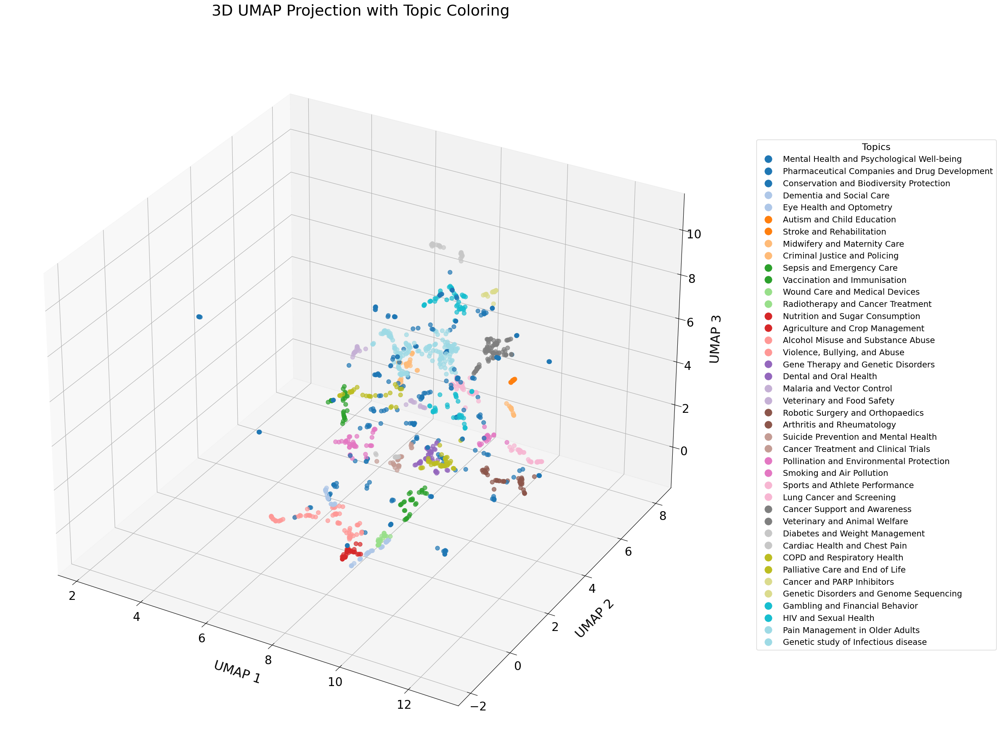

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from umap import UMAP
from hdbscan import HDBSCAN
from mpl_toolkits.mplot3d import Axes3D

# Step 1: Reduce embeddings to 3D using UMAP
umap_model_3d = UMAP(
    n_neighbors=4,
    n_components=3,  # Reduce to 3 dimensions for 3D visualization
    min_dist=0.0,
    metric="cosine",
    random_state=77,
)

umap_embeddings_3d = umap_model_3d.fit_transform(embeddings)

# Step 2: Apply HDBSCAN clustering on the 3D UMAP embeddings (optional)
hsdb_model = HDBSCAN(
    min_cluster_size=12,
    metric="euclidean",
    prediction_data=True,
)

clusters = hsdb_model.fit_predict(umap_embeddings_3d)

# Define topic names (your topics)
topic_names = [
    "Mental Health and Psychological Well-being", "Pharmaceutical Companies and Drug Development",
    "Conservation and Biodiversity Protection", "Dementia and Social Care",
    "Eye Health and Optometry", "Autism and Child Education", "Stroke and Rehabilitation",
    "Midwifery and Maternity Care", "Criminal Justice and Policing", "Sepsis and Emergency Care",
    "Vaccination and Immunisation", "Wound Care and Medical Devices", "Radiotherapy and Cancer Treatment",
    "Nutrition and Sugar Consumption", "Agriculture and Crop Management", "Alcohol Misuse and Substance Abuse",
    "Violence, Bullying, and Abuse", "Gene Therapy and Genetic Disorders", "Dental and Oral Health",
    "Malaria and Vector Control", "Veterinary and Food Safety", "Robotic Surgery and Orthopaedics",
    "Arthritis and Rheumatology", "Suicide Prevention and Mental Health", "Cancer Treatment and Clinical Trials",
    "Pollination and Environmental Protection", "Smoking and Air Pollution", "Sports and Athlete Performance",
    "Lung Cancer and Screening", "Cancer Support and Awareness", "Veterinary and Animal Welfare",
    "Diabetes and Weight Management", "Cardiac Health and Chest Pain", "COPD and Respiratory Health",
    "Palliative Care and End of Life", "Cancer and PARP Inhibitors", "Genetic Disorders and Genome Sequencing",
    "Gambling and Financial Behavior", "HIV and Sexual Health", "Pain Management in Older Adults",
    "Genetic study of Infectious disease"
]

# Adjust the colormap to evenly spread colors
cmap = plt.cm.get_cmap('tab20', len(np.unique(clusters)))  # Spread 'tab20' colormap across all clusters

# Create a scatter plot with UMAP embeddings colored by clusters
fig = plt.figure(figsize=(24, 22))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot with topic coloring
scatter = ax.scatter(
    umap_embeddings_3d[:, 0],
    umap_embeddings_3d[:, 1],
    umap_embeddings_3d[:, 2],
    c=clusters,  # Color by clusters
    cmap=cmap,
    s=50,
    alpha=0.7
)

# Set labels and title with adjusted labelpad to move them further away
ax.set_title("3D UMAP Projection with Topic Coloring", fontsize=26, pad=40)
ax.set_xlabel("UMAP 1", fontsize=22, labelpad=20)
ax.set_ylabel("UMAP 2", fontsize=22, labelpad=20)
ax.set_zlabel("UMAP 3", fontsize=22, labelpad=20)

# Increase tick label size
ax.tick_params(axis='both', which='major', labelsize=20)

# Create a custom legend for the topics, and overlay it on the same plot
handles = [plt.Line2D([0], [0], marker='o', color='w', label=topic,
                      markerfacecolor=plt.cm.tab20(i / len(topic_names)), markersize=14) for i, topic in enumerate(topic_names)]
ax.legend(handles=handles, title="Topics", loc='center left', fontsize=14, title_fontsize=16, bbox_to_anchor=(1.05, 0.5))

# Show the combined plot with the legend overlaid
plt.show()

In [ ]:
topics = [
    "Mental Health and Psychological Well-being",
    "Pharmaceutical Companies and Drug Development",
    "Conservation and Biodiversity Protection",
    "Dementia and Social Care",
    "Eye Health and Optometry",
    "Autism and Child Education",
    "Stroke and Rehabilitation",
    "Midwifery and Maternity Care",
    "Criminal Justice and Policing",
    "Sepsis and Emergency Care",
    "Vaccination and Immunisation",
    "Wound Care and Medical Devices",
    "Radiotherapy and Cancer Treatment",
    "Nutrition and Sugar Consumption",
    "Agriculture and Crop Management",
    "Alcohol Misuse and Substance Abuse",
    "Violence, Bullying, and Abuse",
    "Gene Therapy and Genetic Disorders",
    "Dental and Oral Health",
    "Malaria and Vector Control",
    "Veterinary and Food Safety",
    "Robotic Surgery and Orthopaedics",
    "Arthritis and Rheumatology",
    "Suicide Prevention and Mental Health",
    "Cancer Treatment and Clinical Trials",
    "Pollination and Environmental Protection",
    "Smoking and Air Pollution",
    "Sports and Athlete Performance",
    "Lung Cancer and Screening",
    "Cancer Support and Awareness",
    "Veterinary and Animal Welfare",
    "Diabetes and Weight Management",
    "Cardiac Health and Chest Pain",
    "COPD and Respiratory Health",
    "Palliative Care and End of Life",
    "Cancer and PARP Inhibitors",
    "Genetic Disorders and Genome Sequencing",
    "Gambling and Financial Behavior",
    "HIV and Sexual Health",
    "Pain Management in Older Adults",
    "Genetic study of Infectious disease"
]

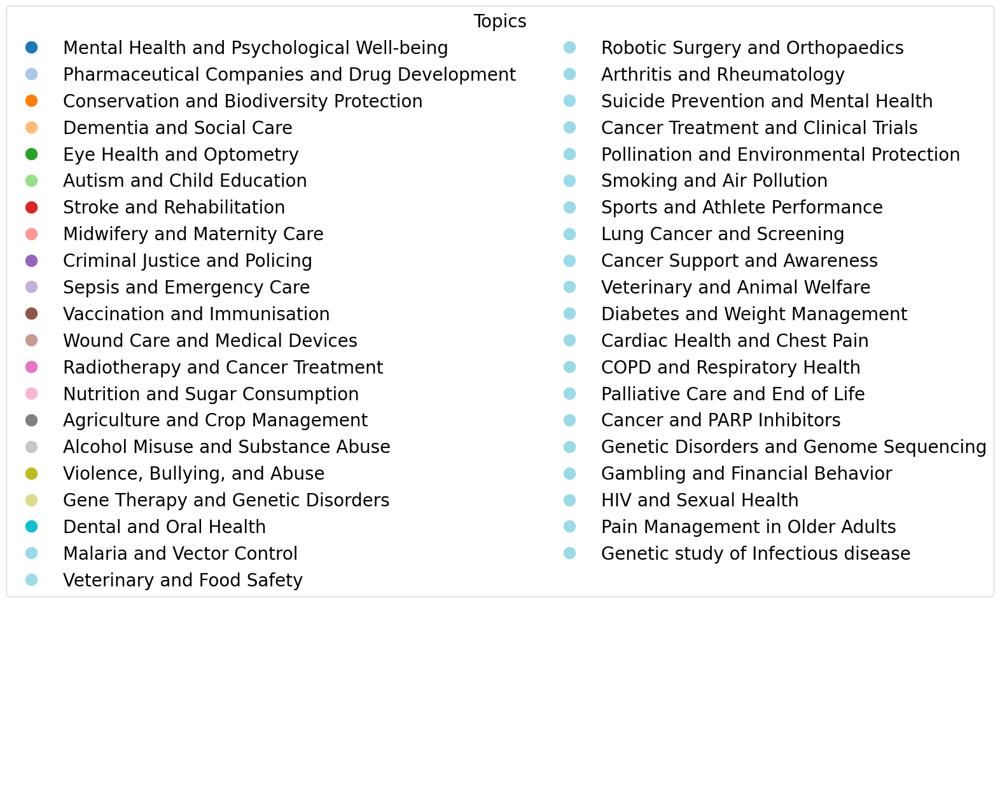

In [ ]:
import matplotlib.pyplot as plt


# Create plot
fig, ax = plt.subplots(figsize=(12, 14))
ax.axis('off')

# Custom legend with smaller text
handles = [plt.Line2D([0], [0], marker='o', color='w', label=topic,
                      markerfacecolor=plt.cm.tab20(i), markersize=15) for i, topic in enumerate(topics)]
ax.legend(handles=handles, title="Topics", loc='upper center', fontsize=20, title_fontsize=20, ncol=2, bbox_to_anchor=(0.5, 1.15))

plt.show()

In [ ]:
for topic in topic_info['Topic'].unique():
    if topic != -1:  # Exclude the outlier topic
        print(f"Topic {topic}:")
        words = topic_model.get_topic(topic)[:20]  # Get top 20 words
        for word, prob in words:
            print(f"  {word} ({prob:.4f})")
        print("\n")

Topic 0:
  mental (0.2524)
  mental health (0.2481)
  psychological (0.1897)
  mbct (0.1882)
  depression (0.1809)
  health (0.1796)
  intervention (0.1758)
  young (0.1710)
  service (0.1697)
  disorder (0.1676)
  psychosis (0.1662)
  young people (0.1658)
  iapt (0.1649)
  training (0.1648)
  itq (0.1641)
  wellbeing (0.1608)
  mindfulness (0.1605)
  ptsd (0.1596)
  people (0.1574)
  sleep (0.1547)


Topic 1:
  company (0.2355)
  product (0.2316)
  drug (0.2153)
  technology (0.2100)
  pharmaceutical (0.1947)
  market (0.1892)
  ltd (0.1889)
  discovery (0.1868)
  investment (0.1844)
  commercial (0.1775)
  development (0.1760)
  patent (0.1728)
  cell (0.1723)
  drug discovery (0.1703)
  new (0.1687)
  gbp (0.1660)
  growth (0.1638)
  protein (0.1569)
  drug development (0.1563)
  camstent (0.1555)


Topic 2:
  conservation (0.3439)
  forest (0.2512)
  specie (0.2493)
  biodiversity (0.2456)
  wildlife (0.2434)
  climate (0.2118)
  iucn (0.1957)
  elephant (0.1949)
  species (0.1917

In [ ]:
for i, topic in enumerate(topics):
    if topic == -1:
        topics[i] = probs[i].argmax()

new_df['Assigned_Topic'] = topics

new_df

,Main panel_x,Unit of assessment number_x,Title,cleaned text,5 Class Labels,Summary impact type,9 Class Labels,Variance,sentence tokenized,word tokenized,string,3 Class Labels,gpt_embedding,Assigned_Topic
0,A,6.0,Agricultural Robotics: Data Driven Technologie...,UoL’s innovative agri-food research has underp...,3,Technological,6,0.666000,"[['uols', 'innovative', 'agrifood', 'research'...","['uols', 'innovative', 'agrifood', 'research',...",uols innovative agrifood research underpin ser...,1,"[0.02778695523738861, 0.03656265512108803, -0....",14
1,A,4.0,Alleviating the societal and economic burden o...,The Cambridge University research has had a si...,4,Health,7,0.444111,"[['cambridge', 'university', 'research', 'sign...","['cambridge', 'university', 'research', 'signi...",cambridge university research significant farr...,1,"[0.025444526225328445, 0.022561024874448776, -...",0
2,A,6.0,Changes in policy for the control of bovine tu...,Bovine tuberculosis is a substantial economic ...,4,Environmental,7,0.450000,"[['bovine', 'tuberculosis', 'substantial', 'ec...","['bovine', 'tuberculosis', 'substantial', 'eco...",bovine tuberculosis substantial economic anima...,1,"[0.019888462498784065, 0.023631425574421883, -...",20
3,A,2.0,Empowering personalised discussion and advance...,Advance decisions about resuscitation are a gl...,4,Health,7,0.358124,"[['advance', 'decision', 'resuscitation', 'glo...","['advance', 'decision', 'resuscitation', 'glob...",advance decision resuscitation global health e...,1,"[0.02248365618288517, -0.008871562778949738, -...",9
4,A,5.0,Improving patient outcomes and treatment guide...,Professor Irving's research has been instrumen...,3,Health,6,0.454204,"[['professor', 'irvings', 'research', 'instrum...","['professor', 'irvings', 'research', 'instrume...",professor irvings research instrumental set na...,1,"[-0.002802259288728237, 0.043551620095968246, ...",38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1345,A,4.0,Transforming the use of Arterial Spin Labellin...,The Arterial Spin Labelling In Dementia (AID) ...,4,Technological,7,0.655264,"[['arterial', 'spin', 'labelling', 'dementia',...","['arterial', 'spin', 'labelling', 'dementia', ...",arterial spin labelling dementia aid programme...,1,"[0.02346917614340782, 0.010281388647854328, -0...",28
1346,A,5.0,Transforming therapeutic outcomes of fatal Duc...,Research undertaken at RHUL led to the develop...,3,Health,7,0.222111,"[['research', 'undertaken', 'rhul', 'lead', 'd...","['research', 'undertaken', 'rhul', 'lead', 'de...",research undertaken rhul lead development gene...,1,"[0.0031257031951099634, 0.024351993575692177, ...",17
1347,A,3.0,Transforming Treatment for Obstructive Sleep A...,Obstructive sleep apnoea (OSA) is one of the m...,3,Health,7,0.234375,"[['obstructive', 'sleep', 'apnoea', 'osa', 'on...","['obstructive', 'sleep', 'apnoea', 'osa', 'one...",obstructive sleep apnoea osa one common respir...,1,"[0.028280194848775864, 0.0345553383231163, -0....",18
1348,A,1.0,Transforming vaccine policy for pneumococcal d...,It was the result of Professor Lim's expertise...,3,Health,7,0.334111,"[['result', 'professor', 'lims', 'expertise', ...","['result', 'professor', 'lims', 'expertise', '...",result professor lims expertise field large sp...,1,"[0.012853133492171764, 0.03865852206945419, -0...",10


In [ ]:

df.reset_index(drop=True, inplace=True)

new_df.reset_index(drop=True, inplace=True)

df = df[df["Main panel_x"] == "A"]


new_df["Weighted Avg"] = df["Weighted Avg"]


In [ ]:
new_df["Summary impact type"].value_counts()

,count
Summary impact type,
Health,662
Societal,293
Technological,223
Environmental,119
Political,25
Legal,19
Economic,5
Cultural,4


In [ ]:
new_df

,Main panel_x,Unit of assessment number_x,Title,cleaned text,5 Class Labels,Summary impact type,9 Class Labels,Variance,sentence tokenized,word tokenized,string,3 Class Labels,gpt_embedding,Assigned_Topic,Weighted Avg,Topic_Name
0,A,6.0,Agricultural Robotics: Data Driven Technologie...,UoL’s innovative agri-food research has underp...,3,Technological,6,0.666000,"[['uols', 'innovative', 'agrifood', 'research'...","['uols', 'innovative', 'agrifood', 'research',...",uols innovative agrifood research underpin ser...,1,"[0.02778695523738861, 0.03656265512108803, -0....",14,NaN,Agriculture and Crop Management
1,A,4.0,Alleviating the societal and economic burden o...,The Cambridge University research has had a si...,4,Health,7,0.444111,"[['cambridge', 'university', 'research', 'sign...","['cambridge', 'university', 'research', 'signi...",cambridge university research significant farr...,1,"[0.025444526225328445, 0.022561024874448776, -...",0,3.000,Mental Health and Psychological Well-being
2,A,6.0,Changes in policy for the control of bovine tu...,Bovine tuberculosis is a substantial economic ...,4,Environmental,7,0.450000,"[['bovine', 'tuberculosis', 'substantial', 'ec...","['bovine', 'tuberculosis', 'substantial', 'eco...",bovine tuberculosis substantial economic anima...,1,"[0.019888462498784065, 0.023631425574421883, -...",20,3.667,Veterinary and Food Safety
3,A,2.0,Empowering personalised discussion and advance...,Advance decisions about resuscitation are a gl...,4,Health,7,0.358124,"[['advance', 'decision', 'resuscitation', 'glo...","['advance', 'decision', 'resuscitation', 'glob...",advance decision resuscitation global health e...,1,"[0.02248365618288517, -0.008871562778949738, -...",9,3.500,Sepsis and Emergency Care
4,A,5.0,Improving patient outcomes and treatment guide...,Professor Irving's research has been instrumen...,3,Health,6,0.454204,"[['professor', 'irvings', 'research', 'instrum...","['professor', 'irvings', 'research', 'instrume...",professor irvings research instrumental set na...,1,"[-0.002802259288728237, 0.043551620095968246, ...",38,NaN,HIV and Sexual Health
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1345,A,4.0,Transforming the use of Arterial Spin Labellin...,The Arterial Spin Labelling In Dementia (AID) ...,4,Technological,7,0.655264,"[['arterial', 'spin', 'labelling', 'dementia',...","['arterial', 'spin', 'labelling', 'dementia', ...",arterial spin labelling dementia aid programme...,1,"[0.02346917614340782, 0.010281388647854328, -0...",28,NaN,Lung Cancer and Screening
1346,A,5.0,Transforming therapeutic outcomes of fatal Duc...,Research undertaken at RHUL led to the develop...,3,Health,7,0.222111,"[['research', 'undertaken', 'rhul', 'lead', 'd...","['research', 'undertaken', 'rhul', 'lead', 'de...",research undertaken rhul lead development gene...,1,"[0.0031257031951099634, 0.024351993575692177, ...",17,NaN,Gene Therapy and Genetic Disorders
1347,A,3.0,Transforming Treatment for Obstructive Sleep A...,Obstructive sleep apnoea (OSA) is one of the m...,3,Health,7,0.234375,"[['obstructive', 'sleep', 'apnoea', 'osa', 'on...","['obstructive', 'sleep', 'apnoea', 'osa', 'one...",obstructive sleep apnoea osa one common respir...,1,"[0.028280194848775864, 0.0345553383231163, -0....",18,NaN,Dental and Oral Health
1348,A,1.0,Transforming vaccine policy for pneumococcal d...,It was the result of Professor Lim's expertise...,3,Health,7,0.334111,"[['result', 'professor', 'lims', 'expertise', ...","['result', 'professor', 'lims', 'expertise', '...",result professor lims expertise field large sp...,1,"[0.012853133492171764, 0.03865852206945419, -0...",10,NaN,Vaccination and Immunisation


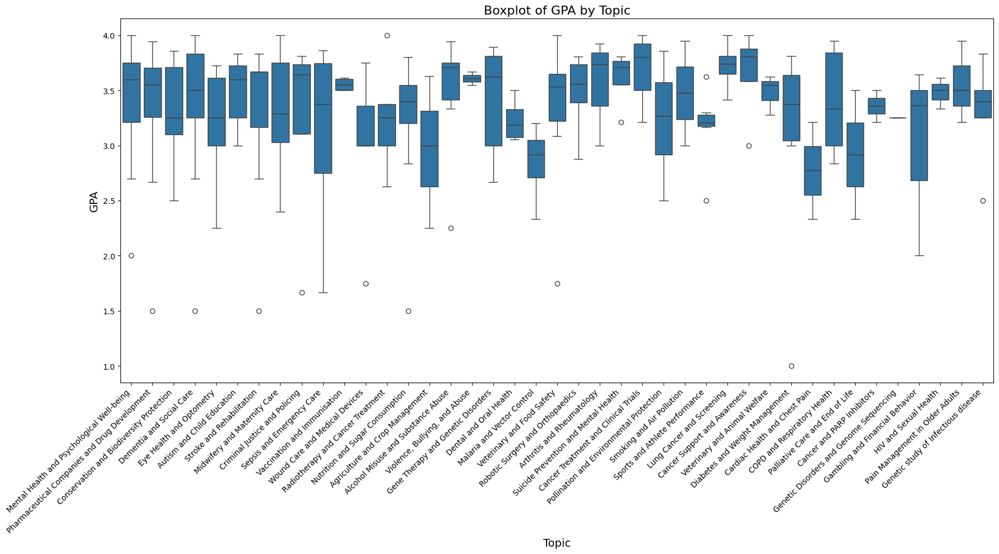

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'new_df' is your DataFrame and it already contains the 'Assigned_Topic' column.

# List of topic names you provided
topic_names = [
    "Mental Health and Psychological Well-being", "Pharmaceutical Companies and Drug Development",
    "Conservation and Biodiversity Protection", "Dementia and Social Care",
    "Eye Health and Optometry", "Autism and Child Education", "Stroke and Rehabilitation",
    "Midwifery and Maternity Care", "Criminal Justice and Policing", "Sepsis and Emergency Care",
    "Vaccination and Immunisation", "Wound Care and Medical Devices", "Radiotherapy and Cancer Treatment",
    "Nutrition and Sugar Consumption", "Agriculture and Crop Management", "Alcohol Misuse and Substance Abuse",
    "Violence, Bullying, and Abuse", "Gene Therapy and Genetic Disorders", "Dental and Oral Health",
    "Malaria and Vector Control", "Veterinary and Food Safety", "Robotic Surgery and Orthopaedics",
    "Arthritis and Rheumatology", "Suicide Prevention and Mental Health", "Cancer Treatment and Clinical Trials",
    "Pollination and Environmental Protection", "Smoking and Air Pollution", "Sports and Athlete Performance",
    "Lung Cancer and Screening", "Cancer Support and Awareness", "Veterinary and Animal Welfare",
    "Diabetes and Weight Management", "Cardiac Health and Chest Pain", "COPD and Respiratory Health",
    "Palliative Care and End of Life", "Cancer and PARP Inhibitors", "Genetic Disorders and Genome Sequencing",
    "Gambling and Financial Behavior", "HIV and Sexual Health", "Pain Management in Older Adults",
    "Genetic study of Infectious disease"
]

# Map the numeric topic labels in 'Assigned_Topic' to the corresponding topic names
new_df['Topic_Name'] = new_df['Assigned_Topic'].map(lambda x: topic_names[x] if x < len(topic_names) else 'Unknown Topic')

# Set figure size and aesthetics
plt.figure(figsize=(18, 10))  # Increased width for better spacing

# Create the boxplot with an explicit order for topic names
sns.boxplot(x='Topic_Name', y='Weighted Avg', data=new_df, order=topic_names)

# Rotate x-axis labels by 45 degrees
plt.xticks(rotation=45, ha='right')  # 'ha' adjusts the horizontal alignment

# Add titles and labels
plt.title('Boxplot of GPA by Topic', fontsize=16)
plt.xlabel('Topic', fontsize=14)
plt.ylabel('GPA', fontsize=14)

# Adjust layout to prevent clipping of tick-labels
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
topics = [
    "Mental Health and Wellbeing", "Pharmaceutical Companies and Drug Discovery",
    "Conservation and Biodiversity", "Dementia Care and Social Prescribing",
    "Eye Health and Vision Care", "Autism and Education", "Stroke and Cardiac Rehabilitation",
    "Midwifery and Maternity Care", "Policing and Criminal Justice", "Sepsis and Pharmacy Safety",
    "Vaccines and Immunization", "Wound Care and Infection Control", "Cancer Treatment and Radiotherapy",
    "Sugar, Nutrition, and Obesity", "Agriculture and Crop Production", "Alcohol and Drug Misuse",
    "Violence and Abuse Prevention", "Gene Therapy and Rare Diseases", "Dental and Oral Health",
    "Malaria and Vector Control", "Veterinary Science and Animal Welfare", "Surgery and Robotic Procedures",
    "Arthritis and Musculoskeletal Disorders", "Suicide Prevention and Mental Health", "Leukemia and Lymphoma Treatment",
    "Pollination and Environmental Protection", "Tobacco and Air Quality", "Sports and Physical Performance",
    "Lung Cancer and Diagnostic Tests", "Cancer Support and Awareness", "Veterinary Care and Animal Welfare",
    "Diabetes and Blood Glucose Management", "Cardiovascular Health and Chest Pain",
    "Respiratory Diseases and Asthma", "Palliative Care and End-of-Life Support", "Cancer and PARP Inhibitors",
    "Genetics and Rare Diseases", "Gambling and Financial Management", "HIV and Prevention Strategies",
    "Pain Management and Elderly Care", "Ebola and Genomic Sequencing"
]

summary_impact_type_counts = {
    "Health": 662,
    "Societal": 293,
    "Technological": 223,
    "Environmental": 119,
    "Political": 25,
    "Legal": 19,
    "Economic": 5,
    "Cultural": 4
}

In [ ]:
new_df

,Main panel_x,Unit of assessment number_x,Title,cleaned text,5 Class Labels,Summary impact type,9 Class Labels,Variance,sentence tokenized,word tokenized,string,3 Class Labels,gpt_embedding,Assigned_Topic,Weighted Avg,Topic_Name
0,A,6.0,Agricultural Robotics: Data Driven Technologie...,UoL’s innovative agri-food research has underp...,3,Technological,6,0.666000,"[['uols', 'innovative', 'agrifood', 'research'...","['uols', 'innovative', 'agrifood', 'research',...",uols innovative agrifood research underpin ser...,1,"[0.02778695523738861, 0.03656265512108803, -0....",14,NaN,Agriculture and Crop Management
1,A,4.0,Alleviating the societal and economic burden o...,The Cambridge University research has had a si...,4,Health,7,0.444111,"[['cambridge', 'university', 'research', 'sign...","['cambridge', 'university', 'research', 'signi...",cambridge university research significant farr...,1,"[0.025444526225328445, 0.022561024874448776, -...",0,3.000,Mental Health and Psychological Well-being
2,A,6.0,Changes in policy for the control of bovine tu...,Bovine tuberculosis is a substantial economic ...,4,Environmental,7,0.450000,"[['bovine', 'tuberculosis', 'substantial', 'ec...","['bovine', 'tuberculosis', 'substantial', 'eco...",bovine tuberculosis substantial economic anima...,1,"[0.019888462498784065, 0.023631425574421883, -...",20,3.667,Veterinary and Food Safety
3,A,2.0,Empowering personalised discussion and advance...,Advance decisions about resuscitation are a gl...,4,Health,7,0.358124,"[['advance', 'decision', 'resuscitation', 'glo...","['advance', 'decision', 'resuscitation', 'glob...",advance decision resuscitation global health e...,1,"[0.02248365618288517, -0.008871562778949738, -...",9,3.500,Sepsis and Emergency Care
4,A,5.0,Improving patient outcomes and treatment guide...,Professor Irving's research has been instrumen...,3,Health,6,0.454204,"[['professor', 'irvings', 'research', 'instrum...","['professor', 'irvings', 'research', 'instrume...",professor irvings research instrumental set na...,1,"[-0.002802259288728237, 0.043551620095968246, ...",38,NaN,HIV and Sexual Health
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1345,A,4.0,Transforming the use of Arterial Spin Labellin...,The Arterial Spin Labelling In Dementia (AID) ...,4,Technological,7,0.655264,"[['arterial', 'spin', 'labelling', 'dementia',...","['arterial', 'spin', 'labelling', 'dementia', ...",arterial spin labelling dementia aid programme...,1,"[0.02346917614340782, 0.010281388647854328, -0...",28,NaN,Lung Cancer and Screening
1346,A,5.0,Transforming therapeutic outcomes of fatal Duc...,Research undertaken at RHUL led to the develop...,3,Health,7,0.222111,"[['research', 'undertaken', 'rhul', 'lead', 'd...","['research', 'undertaken', 'rhul', 'lead', 'de...",research undertaken rhul lead development gene...,1,"[0.0031257031951099634, 0.024351993575692177, ...",17,NaN,Gene Therapy and Genetic Disorders
1347,A,3.0,Transforming Treatment for Obstructive Sleep A...,Obstructive sleep apnoea (OSA) is one of the m...,3,Health,7,0.234375,"[['obstructive', 'sleep', 'apnoea', 'osa', 'on...","['obstructive', 'sleep', 'apnoea', 'osa', 'one...",obstructive sleep apnoea osa one common respir...,1,"[0.028280194848775864, 0.0345553383231163, -0....",18,NaN,Dental and Oral Health
1348,A,1.0,Transforming vaccine policy for pneumococcal d...,It was the result of Professor Lim's expertise...,3,Health,7,0.334111,"[['result', 'professor', 'lims', 'expertise', ...","['result', 'professor', 'lims', 'expertise', '...",result professor lims expertise field large sp...,1,"[0.012853133492171764, 0.03865852206945419, -0...",10,NaN,Vaccination and Immunisation


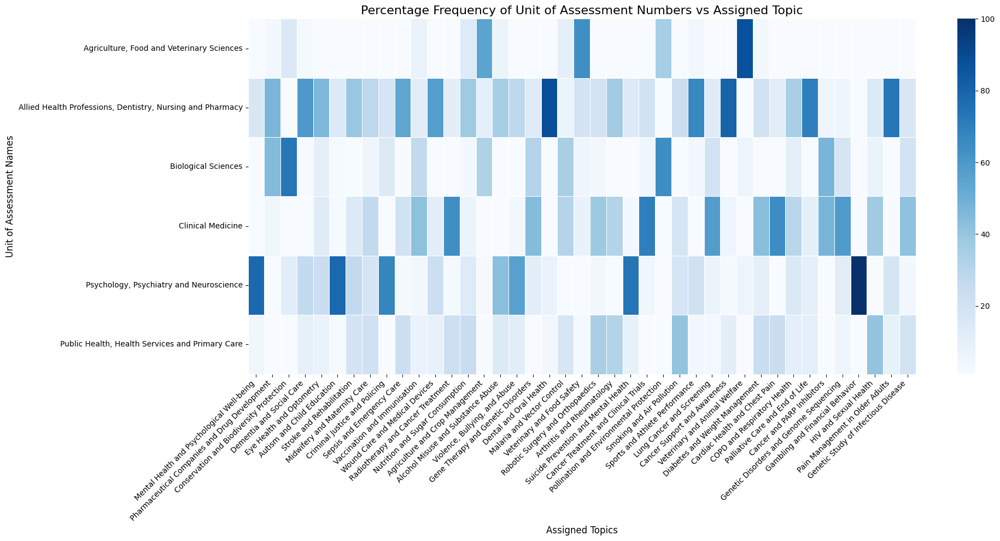

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# List of topic names
topic_names = [
    "Mental Health and Psychological Well-being", "Pharmaceutical Companies and Drug Development",
    "Conservation and Biodiversity Protection", "Dementia and Social Care",
    "Eye Health and Optometry", "Autism and Child Education", "Stroke and Rehabilitation",
    "Midwifery and Maternity Care", "Criminal Justice and Policing", "Sepsis and Emergency Care",
    "Vaccination and Immunisation", "Wound Care and Medical Devices", "Radiotherapy and Cancer Treatment",
    "Nutrition and Sugar Consumption", "Agriculture and Crop Management", "Alcohol Misuse and Substance Abuse",
    "Violence, Bullying, and Abuse", "Gene Therapy and Genetic Disorders", "Dental and Oral Health",
    "Malaria and Vector Control", "Veterinary and Food Safety", "Robotic Surgery and Orthopaedics",
    "Arthritis and Rheumatology", "Suicide Prevention and Mental Health", "Cancer Treatment and Clinical Trials",
    "Pollination and Environmental Protection", "Smoking and Air Pollution", "Sports and Athlete Performance",
    "Lung Cancer and Screening", "Cancer Support and Awareness", "Veterinary and Animal Welfare",
    "Diabetes and Weight Management", "Cardiac Health and Chest Pain", "COPD and Respiratory Health",
    "Palliative Care and End of Life", "Cancer and PARP Inhibitors", "Genetic Disorders and Genome Sequencing",
    "Gambling and Financial Behavior", "HIV and Sexual Health", "Pain Management in Older Adults",
    "Genetic Study of Infectious Disease"
]

# List of Unit of Assessment (UoA) names 1 to 6 based on REF 2021
uoa_names = [
    "Clinical Medicine", "Public Health, Health Services and Primary Care",
    "Allied Health Professions, Dentistry, Nursing and Pharmacy", "Psychology, Psychiatry and Neuroscience",
    "Biological Sciences", "Agriculture, Food and Veterinary Sciences"
]

# Assuming new_df exists and contains the 'Assigned_Topic' and 'Unit of assessment number_x' columns

# Map numeric topic labels in 'Assigned_Topic' to corresponding topic names
new_df['Topic_Name'] = new_df['Assigned_Topic'].map(
    lambda x: topic_names[int(x)] if pd.notna(x) and x < len(topic_names) else 'Unknown Topic'
)

# Map numeric Unit of Assessment labels to UoA names, handling NaN values
new_df['UoA_Name'] = new_df['Unit of assessment number_x'].map(
    lambda x: uoa_names[int(x)-1] if pd.notna(x) and 1 <= x <= 6 else 'Unknown UoA'
)

# Create a cross-tab (heatmap data) with Topic Names and UoA Names
heatmap_data_new = pd.crosstab(new_df["UoA_Name"], new_df["Topic_Name"])

# Reorder the columns in heatmap_data_new to match the order in topic_names
heatmap_data_new = heatmap_data_new.reindex(columns=topic_names, fill_value=0)

# Normalize the heatmap data by each topic (column-wise normalization)
normalized_heatmap_data = heatmap_data_new.div(heatmap_data_new.sum(axis=0), axis=1) * 100  # Convert to percentages

# Plot the normalized heatmap without annotations (numbers)
plt.figure(figsize=(20, 10))
sns.heatmap(normalized_heatmap_data, annot=False, cmap="Blues", cbar=True, linewidths=.5, linecolor='white', vmin=1, vmax=100)

# Update title and labels to reflect the percentage frequency for Unit of Assessment names
plt.title("Percentage Frequency of Unit of Assessment Numbers vs Assigned Topic", fontsize=16)
plt.xlabel("Assigned Topics", fontsize=12)
plt.ylabel("Unit of Assessment Names", fontsize=12)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for readability
plt.tight_layout()
plt.show()

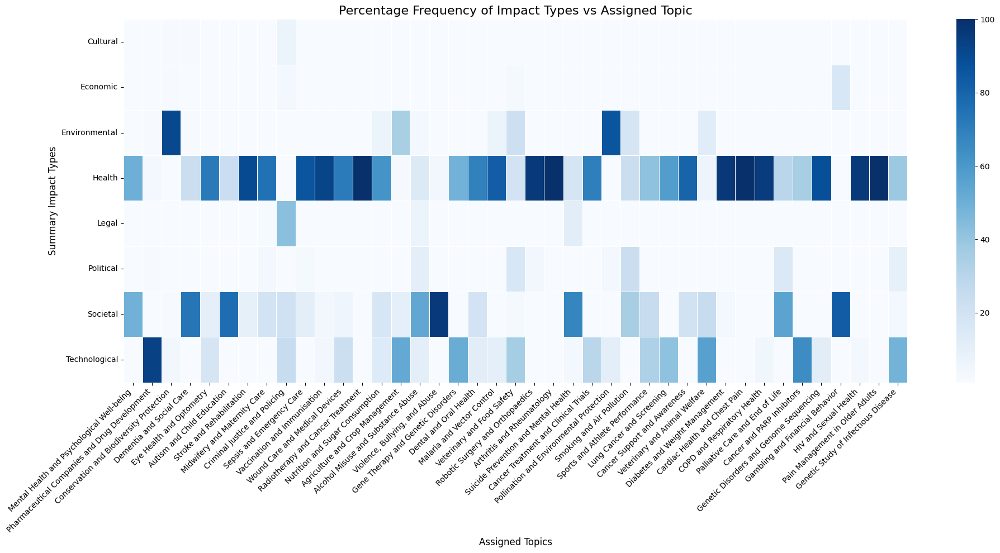

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assuming new_df exists and contains the 'Assigned_Topic' and 'Summary impact type' columns

# Map numeric topic labels in 'Assigned_Topic' to corresponding topic names
new_df['Topic_Name'] = new_df['Assigned_Topic'].map(
    lambda x: topic_names[x] if x < len(topic_names) else 'Unknown Topic'
)

# Create a cross-tab (heatmap data) with Topic Names instead of numbers
heatmap_data_new = pd.crosstab(new_df["Summary impact type"], new_df["Topic_Name"])

# Reorder the columns in heatmap_data_new to match the order in topic_names
heatmap_data_new = heatmap_data_new.reindex(columns=topic_names, fill_value=0)

# Normalize the heatmap data by each topic (column-wise normalization)
normalized_heatmap_data = heatmap_data_new.div(heatmap_data_new.sum(axis=0), axis=1) * 100  # Convert to percentages

# Plot the normalized heatmap without annotations (numbers)
plt.figure(figsize=(20, 10))
sns.heatmap(normalized_heatmap_data, annot=False, cmap="Blues", cbar=True, linewidths=.5, linecolor='white', vmin=1, vmax=100)

# Update title and labels to reflect the percentage frequency
plt.title("Percentage Frequency of Impact Types vs Assigned Topic", fontsize=16)
plt.xlabel("Assigned Topics", fontsize=12)
plt.ylabel("Summary Impact Types", fontsize=12)

# Rotate x-axis labels for readability and set y-axis labels to be straight
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

plt.tight_layout()
plt.show()

In [ ]:
new_df

,Main panel_x,Unit of assessment number_x,Title,cleaned text,5 Class Labels,Summary impact type,9 Class Labels,Variance,sentence tokenized,word tokenized,string,3 Class Labels,gpt_embedding,Assigned_Topic,Weighted Avg,Topic_Name
0,A,6.0,Agricultural Robotics: Data Driven Technologie...,UoL’s innovative agri-food research has underp...,3,Technological,6,0.666000,"[['uols', 'innovative', 'agrifood', 'research'...","['uols', 'innovative', 'agrifood', 'research',...",uols innovative agrifood research underpin ser...,1,"[0.02778695523738861, 0.03656265512108803, -0....",14,NaN,Agriculture and Crop Management
1,A,4.0,Alleviating the societal and economic burden o...,The Cambridge University research has had a si...,4,Health,7,0.444111,"[['cambridge', 'university', 'research', 'sign...","['cambridge', 'university', 'research', 'signi...",cambridge university research significant farr...,1,"[0.025444526225328445, 0.022561024874448776, -...",0,3.000,Mental Health and Psychological Well-being
2,A,6.0,Changes in policy for the control of bovine tu...,Bovine tuberculosis is a substantial economic ...,4,Environmental,7,0.450000,"[['bovine', 'tuberculosis', 'substantial', 'ec...","['bovine', 'tuberculosis', 'substantial', 'eco...",bovine tuberculosis substantial economic anima...,1,"[0.019888462498784065, 0.023631425574421883, -...",20,3.667,Veterinary and Food Safety
3,A,2.0,Empowering personalised discussion and advance...,Advance decisions about resuscitation are a gl...,4,Health,7,0.358124,"[['advance', 'decision', 'resuscitation', 'glo...","['advance', 'decision', 'resuscitation', 'glob...",advance decision resuscitation global health e...,1,"[0.02248365618288517, -0.008871562778949738, -...",9,3.500,Sepsis and Emergency Care
4,A,5.0,Improving patient outcomes and treatment guide...,Professor Irving's research has been instrumen...,3,Health,6,0.454204,"[['professor', 'irvings', 'research', 'instrum...","['professor', 'irvings', 'research', 'instrume...",professor irvings research instrumental set na...,1,"[-0.002802259288728237, 0.043551620095968246, ...",38,NaN,HIV and Sexual Health
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1345,A,4.0,Transforming the use of Arterial Spin Labellin...,The Arterial Spin Labelling In Dementia (AID) ...,4,Technological,7,0.655264,"[['arterial', 'spin', 'labelling', 'dementia',...","['arterial', 'spin', 'labelling', 'dementia', ...",arterial spin labelling dementia aid programme...,1,"[0.02346917614340782, 0.010281388647854328, -0...",28,NaN,Lung Cancer and Screening
1346,A,5.0,Transforming therapeutic outcomes of fatal Duc...,Research undertaken at RHUL led to the develop...,3,Health,7,0.222111,"[['research', 'undertaken', 'rhul', 'lead', 'd...","['research', 'undertaken', 'rhul', 'lead', 'de...",research undertaken rhul lead development gene...,1,"[0.0031257031951099634, 0.024351993575692177, ...",17,NaN,Gene Therapy and Genetic Disorders
1347,A,3.0,Transforming Treatment for Obstructive Sleep A...,Obstructive sleep apnoea (OSA) is one of the m...,3,Health,7,0.234375,"[['obstructive', 'sleep', 'apnoea', 'osa', 'on...","['obstructive', 'sleep', 'apnoea', 'osa', 'one...",obstructive sleep apnoea osa one common respir...,1,"[0.028280194848775864, 0.0345553383231163, -0....",18,NaN,Dental and Oral Health
1348,A,1.0,Transforming vaccine policy for pneumococcal d...,It was the result of Professor Lim's expertise...,3,Health,7,0.334111,"[['result', 'professor', 'lims', 'expertise', ...","['result', 'professor', 'lims', 'expertise', '...",result professor lims expertise field large sp...,1,"[0.012853133492171764, 0.03865852206945419, -0...",10,NaN,Vaccination and Immunisation


In [ ]:
class_sizes = new_df["3 Class Labels"].value_counts()

topics_over_time = topic_model.topics_over_time(docs, timestamps=new_df["3 Class Labels"], topics=topics)

topics_over_time["Frequency"] = topics_over_time.apply(
    lambda row: row["Frequency"] / class_sizes[row["Timestamp"]],
    axis=1
)

3it [00:13,  4.53s/it]


In [ ]:
topic_model.visualize_topics_over_time(topics_over_time, topics = [1, 2, 3, 5, 6, 7, 8, 10])


In [ ]:
for topic_num in range(topics_count):
    topic_words = topic_model.get_topic(topic_num)
    print(f"\nTopic {topic_num} - Top 20 Words:")
    for word, score in topic_words:
        print(f"{word}: {score:.4f}")


Topic 0 - Top 20 Words:
conservation: 0.2530
specie: 0.2001
biodiversity: 0.1892
forest: 0.1738
environmental: 0.1717
wildlife: 0.1711
seed: 0.1672
natural: 0.1666
management: 0.1654
marine: 0.1654
pesticide: 0.1632
crop: 0.1630
research: 0.1615
pollinator: 0.1607
pain: 0.1592
government: 0.1563
agriculture: 0.1562
plant: 0.1539
farmer: 0.1539
farm: 0.1538

Topic 1 - Top 20 Words:
care: 0.2347
dementia: 0.2148
health: 0.1966
people: 0.1764
palliative: 0.1708
nursing: 0.1696
nurse: 0.1682
social: 0.1663
care home: 0.1650
palliative care: 0.1642
support: 0.1624
practice: 0.1608
home: 0.1608
staff: 0.1602
service: 0.1591
training: 0.1589
nhs: 0.1577
carers: 0.1501
research: 0.1478
programme: 0.1477

Topic 2 - Top 20 Words:
cancer: 0.3135
patient: 0.2322
trial: 0.2221
treatment: 0.2211
clinical: 0.2048
gene: 0.1999
inhibitor: 0.1900
therapy: 0.1871
olaparib: 0.1859
survival: 0.1820
disease: 0.1812
chemotherapy: 0.1799
oncology: 0.1769
phase: 0.1748
mutation: 0.1745
ovarian: 0.1741
approva

In [ ]:
topic_info

NameError: name 'topic_info' is not defined

In [ ]:
import optuna
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from umap import UMAP
from hdbscan import HDBSCAN
from bertopic.vectorizers import ClassTfidfTransformer
from sklearn.metrics import silhouette_score
from collections import Counter
from gensim.models.coherencemodel import CoherenceModel

docs = new_df["cleaned text"].tolist()

#embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

#embeddings = embedding_model.encode(docs, show_progress_bar=True)

embeddings = np.array(new_df["gpt_embedding"].tolist())

# Define the objective function for optimization
def objective(trial):
    # Suggest only the 'n_neighbors' hyperparameter for optimization
    n_neighbors = trial.suggest_int("n_neighbors", 2, 15)

    # Fixed values for other UMAP hyperparameters
    n_components = 10  # Example fixed value, adjust as needed
    min_dist = 0.1     # Example fixed value, adjust as needed

    # Fixed values for HDBSCAN hyperparameters
    min_cluster_size = 10  # Example fixed value, adjust as needed

    # Fixed values for BERTopic hyperparameters
    top_n_words = 20       # Example fixed value, adjust as needed
    n_gram_range = (1, 2)  # Example fixed value, adjust as needed

    # UMAP model with the optimized 'n_neighbors' parameter
    umap_model = UMAP(
        n_neighbors=n_neighbors,
        n_components=n_components,
        min_dist=min_dist,
        metric="cosine",
        random_state=77,
    )

    # HDBSCAN model
    hsdb_model = HDBSCAN(
        min_cluster_size=min_cluster_size,
        metric="euclidean",
        prediction_data=True,
    )

    # ClassTFIDF model
    ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)

    # BERTopic model
    topic_model = BERTopic(
        language="english",
        verbose=True,
        calculate_probabilities=True,
        n_gram_range=n_gram_range,
        umap_model=umap_model,
        hdbscan_model=hsdb_model,
        ctfidf_model=ctfidf_model,
        top_n_words=top_n_words,
        nr_topics=None,
    )

    # Fit the BERTopic model
    topics, probs = topic_model.fit_transform(docs, embeddings)

    # Calculate silhouette score
    silhouette_avg = calculate_silhouette_score(topic_model, embeddings, topics)

    # Return the silhouette score for Optuna to maximize
    return silhouette_avg

# Create the study

search_space = {
    "n_neighbors": list(range(2, 16))  # All values from 2 to 15 inclusive
}

sampler = optuna.samplers.GridSampler(search_space)

study = optuna.create_study(direction="maximize", sampler=sampler)
study.optimize(objective, n_trials=len(search_space["n_neighbors"]))  # Total number of trials is equal to the size of grid

# Print the best result
print(f"Best n_neighbors: {study.best_trial.params['n_neighbors']}")
print(f"Best silhouette score: {study.best_trial.value}")

[I 2024-09-03 22:34:07,213] A new study created in memory with name: no-name-9db32a76-0654-452c-b0a3-4392b0ba05ca
2024-09-03 22:34:07,218 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-09-03 22:34:17,231 - BERTopic - Dimensionality - Completed ✓
2024-09-03 22:34:17,233 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-09-03 22:34:17,388 - BERTopic - Cluster - Completed ✓
2024-09-03 22:34:17,392 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-09-03 22:34:22,107 - BERTopic - Representation - Completed ✓
[I 2024-09-03 22:34:24,669] Trial 0 finished with value: 0.5119359493255615 and parameters: {'n_neighbors': 10}. Best is trial 0 with value: 0.5119359493255615.
2024-09-03 22:34:24,674 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-09-03 22:34:34,419 - BERTopic - Dimensionality - Completed ✓
2024-09-03 22:34:34,421 - BERTopic - Cluster - Start clustering 

Best n_neighbors: 6
Best silhouette score: 0.6026902198791504


In [ ]:
#import matplotlib.pyplot as plt


#optuna.visualization.plot_optimization_history(study).show()



In [ ]:
#topic_info = topic_model.get_topic_info()

#topic_info

,Topic,Count,Name,Representation,Representative_Docs
0,-1,142,-1_police_on_by_in the,"[police, on, by, in the, of the, as, is, that,...",[Davis' research has had wide-ranging impact e...
1,0,137,0_mental_mental health_health_training,"[mental, mental health, health, training, peop...","[The World Health Organization reports that, g..."
2,1,103,1_malaria_control_hcv_resistance,"[malaria, control, hcv, resistance, who, antim...",[The University of Oxford research showed the ...
3,2,101,2_patients_genetic_clinical_diabetes,"[patients, genetic, clinical, diabetes, diseas...",[Lung cancer is the most common cause of cance...
4,3,53,3_company_products_the company_alsmnd,"[company, products, the company, alsmnd, nacle...",[The research outlined above has impacted dire...
5,4,51,4_conservation_species_wildlife_biodiversity,"[conservation, species, wildlife, biodiversity...",[Global public interest and recognition AudioM...
6,5,42,5_stroke_rehabilitation_of stroke_ms,"[stroke, rehabilitation, of stroke, ms, servic...","[Following a stroke, it is common for a patien..."
7,6,41,6_diabetes_weight_falls_home,"[diabetes, weight, falls, home, home safety, e...",[Lloyd’s research leadership in the field of o...
8,7,36,7_breastfeeding_prescribing_trauma_pincer,"[breastfeeding, prescribing, trauma, pincer, y...",[We have developed and tested a pharmacist-led...
9,8,35,8_smoking_sugar_tobacco_drinks,"[smoking, sugar, tobacco, drinks, packaging, b...",[Improving health through policy-mandated redu...


In [ ]:
for i, topic in enumerate(topics):
    if topic == -1:
        topics[i] = probs[i].argmax()

new_df['Assigned_Topic'] = topics

new_df

,Main panel_x,Unit of assessment number_x,Title,cleaned text,5 Class Labels,Summary impact type,9 Class Labels,Variance,sentence tokenized,word tokenized,string,3 Class Labels,gpt_embedding,Assigned_Topic
0,A,6.0,Agricultural Robotics: Data Driven Technologie...,UoL’s innovative agri-food research has underp...,3,Technological,6,0.666000,"[['uols', 'innovative', 'agrifood', 'research'...","['uols', 'innovative', 'agrifood', 'research',...",uols innovative agrifood research underpin ser...,1,"[0.02778695523738861, 0.03656265512108803, -0....",0
1,A,4.0,Alleviating the societal and economic burden o...,The Cambridge University research has had a si...,4,Health,7,0.444111,"[['cambridge', 'university', 'research', 'sign...","['cambridge', 'university', 'research', 'signi...",cambridge university research significant farr...,1,"[0.025444526225328445, 0.022561024874448776, -...",20
2,A,6.0,Changes in policy for the control of bovine tu...,Bovine tuberculosis is a substantial economic ...,4,Environmental,7,0.450000,"[['bovine', 'tuberculosis', 'substantial', 'ec...","['bovine', 'tuberculosis', 'substantial', 'eco...",bovine tuberculosis substantial economic anima...,1,"[0.019888462498784065, 0.023631425574421883, -...",12
3,A,2.0,Empowering personalised discussion and advance...,Advance decisions about resuscitation are a gl...,4,Health,7,0.358124,"[['advance', 'decision', 'resuscitation', 'glo...","['advance', 'decision', 'resuscitation', 'glob...",advance decision resuscitation global health e...,1,"[0.02248365618288517, -0.008871562778949738, -...",10
4,A,5.0,Improving patient outcomes and treatment guide...,Professor Irving's research has been instrumen...,3,Health,6,0.454204,"[['professor', 'irvings', 'research', 'instrum...","['professor', 'irvings', 'research', 'instrume...",professor irvings research instrumental set na...,1,"[-0.002802259288728237, 0.043551620095968246, ...",3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1345,A,4.0,Transforming the use of Arterial Spin Labellin...,The Arterial Spin Labelling In Dementia (AID) ...,4,Technological,7,0.655264,"[['arterial', 'spin', 'labelling', 'dementia',...","['arterial', 'spin', 'labelling', 'dementia', ...",arterial spin labelling dementia aid programme...,1,"[0.02346917614340782, 0.010281388647854328, -0...",13
1346,A,5.0,Transforming therapeutic outcomes of fatal Duc...,Research undertaken at RHUL led to the develop...,3,Health,7,0.222111,"[['research', 'undertaken', 'rhul', 'lead', 'd...","['research', 'undertaken', 'rhul', 'lead', 'de...",research undertaken rhul lead development gene...,1,"[0.0031257031951099634, 0.024351993575692177, ...",2
1347,A,3.0,Transforming Treatment for Obstructive Sleep A...,Obstructive sleep apnoea (OSA) is one of the m...,3,Health,7,0.234375,"[['obstructive', 'sleep', 'apnoea', 'osa', 'on...","['obstructive', 'sleep', 'apnoea', 'osa', 'one...",obstructive sleep apnoea osa one common respir...,1,"[0.028280194848775864, 0.0345553383231163, -0....",1
1348,A,1.0,Transforming vaccine policy for pneumococcal d...,It was the result of Professor Lim's expertise...,3,Health,7,0.334111,"[['result', 'professor', 'lims', 'expertise', ...","['result', 'professor', 'lims', 'expertise', '...",result professor lims expertise field large sp...,1,"[0.012853133492171764, 0.03865852206945419, -0...",8
